In [27]:
!pip install geopandas

In [58]:
import osmnx as ox
import networkx as nx
import osmnx as ox
import folium
import geopandas as gp
import pyproj
import numpy as np

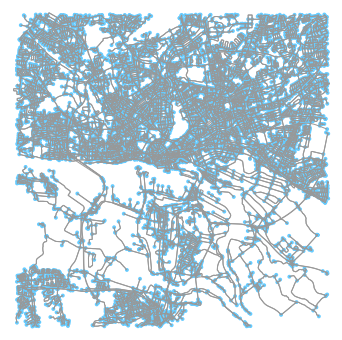

In [11]:
G = ox.graph_from_point((53.54, 10.00), dist=10000, network_type='drive')
ox.plot_graph(G)
#G.to_csv('hamburgosm.csv')
ox.save_graph_shapefile(G)

In [12]:
edges = ox.graph_to_gdfs(G, nodes=False, edges=True)
edges.columns

Index(['u', 'v', 'key', 'osmid', 'name', 'highway', 'oneway', 'length',
       'geometry', 'maxspeed', 'lanes', 'ref', 'bridge', 'junction', 'access',
       'width', 'tunnel', 'service', 'est_width'],
      dtype='object')

edges.crs

In [13]:
edges['geometry'].dtype

In [14]:
edges['geometry']

0          LINESTRING (9.95746 53.54878, 9.95698 53.54902)
1          LINESTRING (9.95746 53.54878, 9.95633 53.54804)
2        LINESTRING (10.03673 53.50174, 10.03695 53.501...
3          LINESTRING (9.95721 53.54917, 9.95698 53.54902)
4          LINESTRING (9.98495 53.59535, 9.98461 53.59545)
                               ...                        
33463      LINESTRING (9.93793 53.54855, 9.93836 53.54855)
33464    LINESTRING (9.93793 53.54855, 9.93794 53.54786...
33465    LINESTRING (9.93793 53.54855, 9.93794 53.54897...
33466    LINESTRING (9.99851 53.54989, 9.99860 53.54990...
33467    LINESTRING (9.99851 53.54989, 9.99793 53.54987...
Name: geometry, Length: 33468, dtype: geometry

In [65]:
speeds = []
for i in edges['maxspeed']:
    if isinstance(i, float):
        speeds.append(i)
    elif isinstance(i, string):
        speeds.append(i)
    else:
        for j in i:
            speeds.append(j)
speeds.mean()

TypeError: 'float' object is not iterable

In [16]:
print(edges['maxspeed'].value_counts())

30                        14302
50                        12730
60                          386
[50, 30]                    272
20                          138
10                           66
80                           66
15                           54
[60, 50]                     51
100                          48
25                           29
120                          24
[60, 80]                     16
none                         11
40                           11
[80, 50]                      9
70                            9
[100, 50]                     8
[20, 50]                      8
[50, none]                    7
7                             6
[60, 100]                     5
signals                       5
6                             5
[20, 30]                      5
[10, 30]                      4
[80, 100]                     4
[60, 30]                      4
5                             4
[50, 25]                      3
[80, 50, 40]                  3
[120, 10

In [17]:
print(edges['highway'].value_counts())

residential                                   17579
tertiary                                       4465
secondary                                      4257
unclassified                                   2864
primary                                        2299
living_street                                   876
motorway_link                                   265
secondary_link                                  147
primary_link                                    122
trunk_link                                      114
[living_street, residential]                    110
motorway                                         98
tertiary_link                                    95
trunk                                            73
[unclassified, residential]                      68
road                                             16
[tertiary, residential]                           4
[motorway, motorway_link]                         3
yes                                               2
[tertiary, u

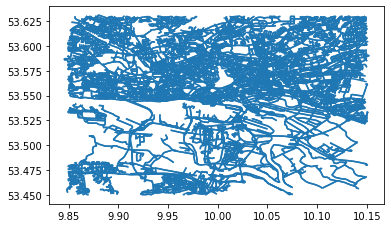

In [33]:
edges.plot()

In [19]:
edges.head()

,u,v,key,osmid,name,highway,oneway,length,geometry,maxspeed,lanes,ref,bridge,junction,access,width,tunnel,service,est_width
0,26411008,266398601,0,24502396,Am Nobisteich,residential,False,41.891,"LINESTRING (9.95746 53.54878, 9.95698 53.54902)",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,26411008,26410989,0,40228311,Lincolnstraße,residential,True,111.426,"LINESTRING (9.95746 53.54878, 9.95633 53.54804)",30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1165197312,1165197239,0,100819415,NaN,unclassified,False,52.931,"LINESTRING (10.03673 53.50174, 10.03695 53.501...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,26411010,266398601,0,4338732,Herrenweide,residential,False,22.100,"LINESTRING (9.95721 53.54917, 9.95698 53.54902)",30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5588615169,1561759859,0,584708067,Lokstedter Weg,primary,False,25.121,"LINESTRING (9.98495 53.59535, 9.98461 53.59545)",50,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
#def buff()

In [53]:
prjedge = edges.to_crs('EPSG:25832')
pjredgebf = prjedge.buffer(5)

In [55]:
#pjredgebf.plot(figsize=(15,15))

In [41]:
m = folium.Map([53.5, 10.0], tiles = 'cartodbpositron', zoom_start=12)
 
folium.Choropleth(
    edges[edges.geometry.length>0.001],
    line_weight=1,
    line_color='blue'
).add_to(m)
 
m

In [21]:
#print(ox.__version__)
#print(nx.__version__)
graph = ox.graph_from_place('Piedmont, California, USA', network_type='drive')
graph
#gdf_nodes, gdf_edges = ox.graph_to_gdfs(
        #graph,
        #nodes=True, edges=True,
        #node_geometry=True,
        #fill_edge_geometry=True)
#graph2 = ox.gdfs_to_graph(gdf_nodes, gdf_edges)